# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
import scipy.cluster.hierarchy as sch
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import silhouette_score as sil, calinski_harabasz_score as chs, silhouette_samples
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

# Importing Data

In [2]:
df =pd.read_excel('EastWestAirlines.xlsx',sheet_name='data')
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


# Data Preprocessing

In [3]:
df.describe()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3999.000000,3999.000000,3999.000000,3999.000000,3999.000000,3999.00000,3999.000000,3999.000000,3999.00000,3999.000000
mean,2014.819455,7.360133e+04,144.114529,2.059515,1.014504,1.012253,17144.846212,11.60190,460.055764,1.373593,4118.55939,0.370343
std,1160.764358,1.007757e+05,773.663804,1.376919,0.147650,0.195241,24150.967826,9.60381,1400.209171,3.793172,2065.13454,0.482957
min,1.000000,0.000000e+00,0.000000,1.000000,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,2.00000,0.000000
25%,1010.500000,1.852750e+04,0.000000,1.000000,1.000000,1.000000,1250.000000,3.00000,0.000000,0.000000,2330.00000,0.000000
50%,2016.000000,4.309700e+04,0.000000,1.000000,1.000000,1.000000,7171.000000,12.00000,0.000000,0.000000,4096.00000,0.000000
75%,3020.500000,9.240400e+04,0.000000,3.000000,1.000000,1.000000,23800.500000,17.00000,311.000000,1.000000,5790.50000,1.000000
max,4021.000000,1.704838e+06,11148.000000,5.000000,3.000000,5.000000,263685.000000,86.00000,30817.000000,53.000000,8296.00000,1.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3999 entries, 0 to 3998
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype
---  ------             --------------  -----
 0   ID#                3999 non-null   int64
 1   Balance            3999 non-null   int64
 2   Qual_miles         3999 non-null   int64
 3   cc1_miles          3999 non-null   int64
 4   cc2_miles          3999 non-null   int64
 5   cc3_miles          3999 non-null   int64
 6   Bonus_miles        3999 non-null   int64
 7   Bonus_trans        3999 non-null   int64
 8   Flight_miles_12mo  3999 non-null   int64
 9   Flight_trans_12    3999 non-null   int64
 10  Days_since_enroll  3999 non-null   int64
 11  Award?             3999 non-null   int64
dtypes: int64(12)
memory usage: 375.0 KB


In [5]:
df.dtypes

ID#                  int64
Balance              int64
Qual_miles           int64
cc1_miles            int64
cc2_miles            int64
cc3_miles            int64
Bonus_miles          int64
Bonus_trans          int64
Flight_miles_12mo    int64
Flight_trans_12      int64
Days_since_enroll    int64
Award?               int64
dtype: object

In [6]:
# checking the missing values

df.isnull().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

In [7]:
print(df[['Qual_miles','cc2_miles','ID#','Balance','cc1_miles','cc3_miles','Bonus_miles','Bonus_trans','Flight_miles_12mo','Flight_trans_12','Days_since_enroll','Award?']].nunique())

Qual_miles            164
cc2_miles               3
ID#                  3999
Balance              3904
cc1_miles               5
cc3_miles               5
Bonus_miles          2734
Bonus_trans            57
Flight_miles_12mo     343
Flight_trans_12        35
Days_since_enroll    2820
Award?                  2
dtype: int64


In [8]:
# Droping the unwanted Columns

df.drop(columns=['Qual_miles','cc2_miles','cc3_miles'],inplace=True)
df

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,1,174,1,0,0,7000,0
1,2,19244,1,215,2,0,0,6968,0
2,3,41354,1,4123,4,0,0,7034,0
3,4,14776,1,500,1,0,0,6952,0
4,5,97752,4,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...
3994,4017,18476,1,8525,4,200,1,1403,1
3995,4018,64385,1,981,5,0,0,1395,1
3996,4019,73597,3,25447,8,0,0,1402,1
3997,4020,54899,1,500,1,500,1,1401,0


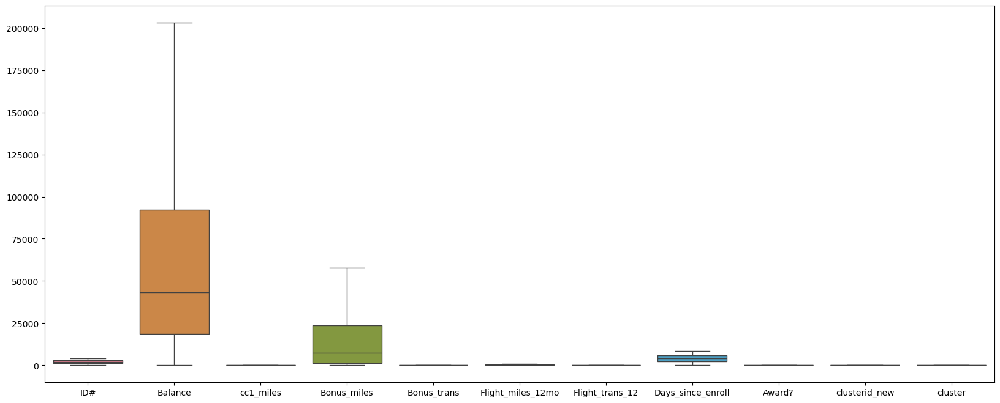

In [52]:
# checking the outliers

plt.figure(figsize=(20,8))
plt.tight_layout
sns.boxplot(df)
plt.show()

In [10]:
# Removing outliers

def outlier_Detection(ed,columns):
    for col in columns:
        Q1=df[col].quantile(0.25)
        Q3=df[col].quantile(0.75)
        iqr=Q3-Q1
        lower=Q1-1.5*iqr
        upper=Q3+1.5*iqr
        df[col]=np.where(ed[col]>upper,upper,np.where(df[col]<lower,lower,ed[col]))
    return df 


In [11]:
outlier_Detection(df,['Balance','Bonus_miles','Bonus_trans','Flight_miles_12mo','Flight_trans_12'])

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143.0,1,174.0,1.0,0.0,0.0,7000,0
1,2,19244.0,1,215.0,2.0,0.0,0.0,6968,0
2,3,41354.0,1,4123.0,4.0,0.0,0.0,7034,0
3,4,14776.0,1,500.0,1.0,0.0,0.0,6952,0
4,5,97752.0,4,43300.0,26.0,777.5,2.5,6935,1
...,...,...,...,...,...,...,...,...,...
3994,4017,18476.0,1,8525.0,4.0,200.0,1.0,1403,1
3995,4018,64385.0,1,981.0,5.0,0.0,0.0,1395,1
3996,4019,73597.0,3,25447.0,8.0,0.0,0.0,1402,1
3997,4020,54899.0,1,500.0,1.0,500.0,1.0,1401,0


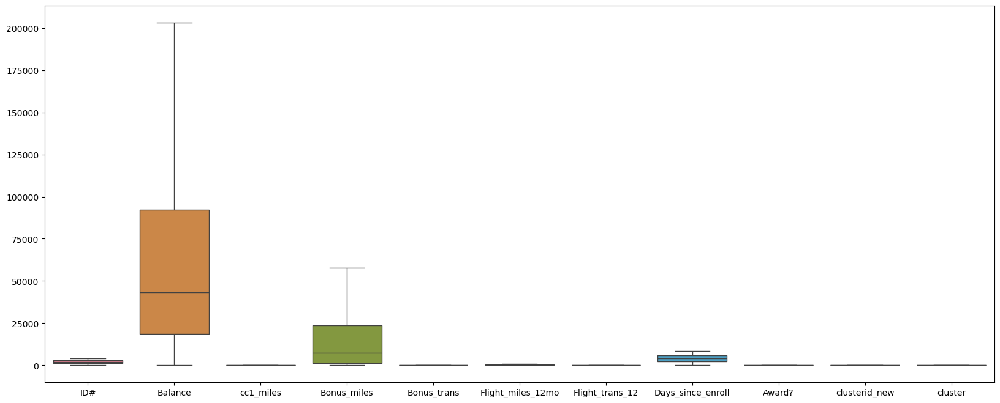

In [51]:
# checking again

plt.figure(figsize=(20,8))
plt.tight_layout
sns.boxplot(df)
plt.show()

In [13]:
# Standard Scaler

#Convert data in the Standard Scale 0-1
sc = StandardScaler()

In [14]:
data=sc.fit_transform(df)
data

array([[-1.73512503, -0.60725829, -0.76957841, ..., -0.62614341,
         1.39545434, -0.7669193 ],
       [-1.73426342, -0.75894657, -0.76957841, ..., -0.62614341,
         1.37995704, -0.7669193 ],
       [-1.73340181, -0.38206963, -0.76957841, ..., -0.62614341,
         1.41192021, -0.7669193 ],
       ...,
       [ 1.72682006,  0.1675298 ,  0.68312117, ..., -0.62614341,
        -1.31560393,  1.30391816],
       [ 1.72768167, -0.15118775, -0.76957841, ...,  0.43238439,
        -1.31608822, -0.7669193 ],
       [ 1.72854328, -1.03556163, -0.76957841, ..., -0.62614341,
        -1.31754109, -0.7669193 ]])

In [15]:
pd.DataFrame(sc.fit_transform(df))

,0,1,2,3,4,5,6,7,8
0,-1.735125,-0.607258,-0.769578,-0.843091,-1.148854,-0.604313,-0.626143,1.395454,-0.766919
1,-1.734263,-0.758947,-0.769578,-0.840822,-1.039133,-0.604313,-0.626143,1.379957,-0.766919
2,-1.733402,-0.382070,-0.769578,-0.624581,-0.819689,-0.604313,-0.626143,1.411920,-0.766919
3,-1.732540,-0.835106,-0.769578,-0.825052,-1.148854,-0.604313,-0.626143,1.372208,-0.766919
4,-1.731679,0.579265,1.409471,1.543191,1.594189,2.034489,2.020176,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...
3994,1.725097,-0.772038,-0.769578,-0.381007,-0.819689,0.074478,0.432384,-1.315120,1.303918
3995,1.725958,0.010506,-0.769578,-0.798437,-0.709967,-0.604313,-0.626143,-1.318994,1.303918
3996,1.726820,0.167530,0.683121,0.555335,-0.380802,-0.604313,-0.626143,-1.315604,1.303918
3997,1.727682,-0.151188,-0.769578,-0.825052,-1.148854,1.092666,0.432384,-1.316088,-0.766919


In [16]:
scaled_data=pd.DataFrame(data,columns=df.columns)
scaled_data

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,-1.735125,-0.607258,-0.769578,-0.843091,-1.148854,-0.604313,-0.626143,1.395454,-0.766919
1,-1.734263,-0.758947,-0.769578,-0.840822,-1.039133,-0.604313,-0.626143,1.379957,-0.766919
2,-1.733402,-0.382070,-0.769578,-0.624581,-0.819689,-0.604313,-0.626143,1.411920,-0.766919
3,-1.732540,-0.835106,-0.769578,-0.825052,-1.148854,-0.604313,-0.626143,1.372208,-0.766919
4,-1.731679,0.579265,1.409471,1.543191,1.594189,2.034489,2.020176,1.363975,1.303918
...,...,...,...,...,...,...,...,...,...
3994,1.725097,-0.772038,-0.769578,-0.381007,-0.819689,0.074478,0.432384,-1.315120,1.303918
3995,1.725958,0.010506,-0.769578,-0.798437,-0.709967,-0.604313,-0.626143,-1.318994,1.303918
3996,1.726820,0.167530,0.683121,0.555335,-0.380802,-0.604313,-0.626143,-1.315604,1.303918
3997,1.727682,-0.151188,-0.769578,-0.825052,-1.148854,1.092666,0.432384,-1.316088,-0.766919


In [17]:
scaled_data.describe()

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
count,3999.000000,3.999000e+03,3.999000e+03,3.999000e+03,3.999000e+03,3.999000e+03,3.999000e+03,3.999000e+03,3.999000e+03
mean,0.000000,-5.685763e-17,1.705729e-16,-2.842882e-17,2.842882e-17,-7.107204e-18,4.264322e-17,5.685763e-17,1.421441e-17
std,1.000125,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00,1.000125e+00
min,-1.735125,-1.086971e+00,-7.695784e-01,-8.527184e-01,-1.258576e+00,-6.043135e-01,-6.261434e-01,-1.993611e+00,-7.669193e-01
25%,-0.865331,-7.711597e-01,-7.695784e-01,-7.835524e-01,-9.294109e-01,-6.043135e-01,-6.261434e-01,-8.661823e-01,-7.669193e-01
50%,0.001017,-3.523592e-01,-7.695784e-01,-4.559271e-01,5.808475e-02,-6.043135e-01,-6.261434e-01,-1.092530e-02,-7.669193e-01
75%,0.866503,4.881053e-01,6.831212e-01,4.642292e-01,6.066935e-01,4.512077e-01,4.323844e-01,8.097050e-01,1.303918e+00
max,1.728543,2.377003e+00,2.135821e+00,2.335902e+00,2.910850e+00,2.034489e+00,2.020176e+00,2.023095e+00,1.303918e+00


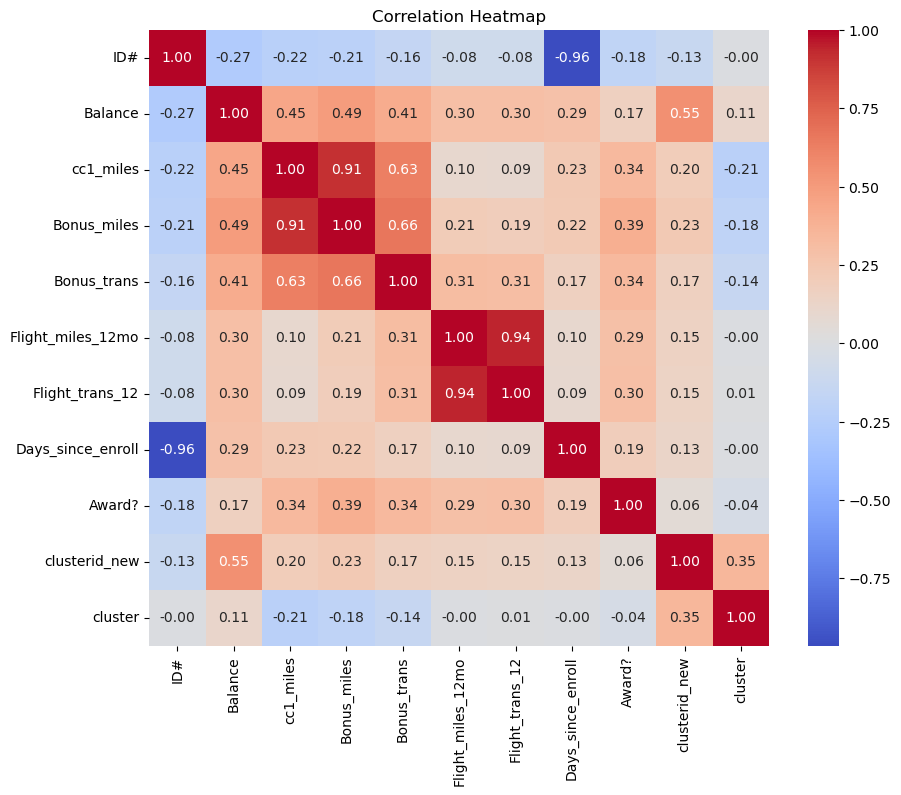

In [53]:
# Step 3: Visualize correlations

plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

In [54]:
# Apply PCA

pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
pca_df = pd.DataFrame(pca_data, columns=['PC1', 'PC2'])

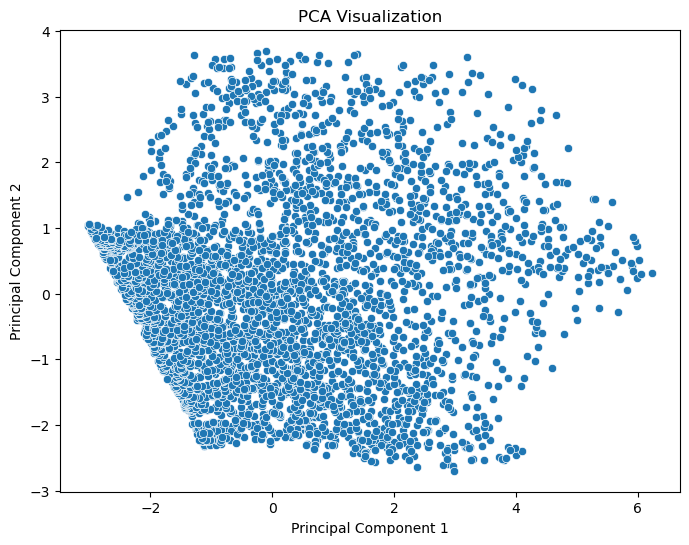

In [55]:
# Visualize PCA results

plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

In [56]:
#Apply K-Means Clustering

kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(scaled_data)

In [57]:
# Add cluster labels to PCA DataFrame

pca_df['Cluster'] = clusters

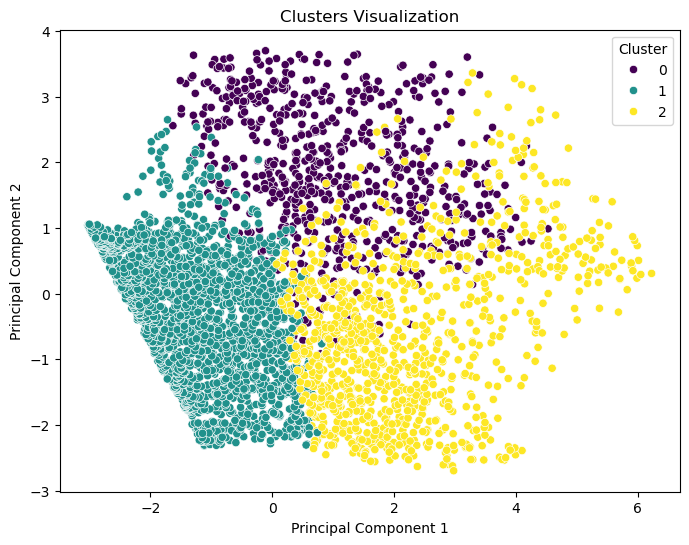

In [58]:
# Visualize clusters

plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', palette='viridis', data=pca_df)
plt.title('Clusters Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.show()

<Figure size 2000x800 with 0 Axes>

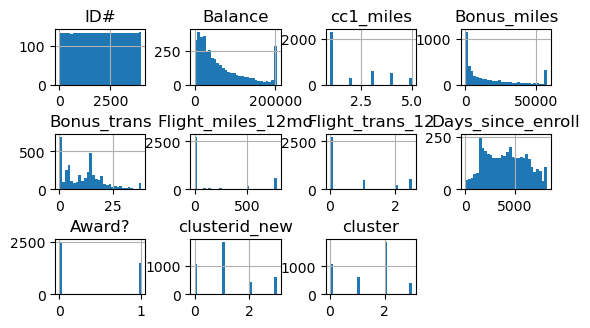

In [59]:
# Visualistaion

# Histogram
plt.figure(figsize=(20,8))
plt.tight_layout()
df.hist(layout=(4,4),bins=30)
plt.subplots_adjust(hspace = 0.9, wspace = 0.5)
plt.show()

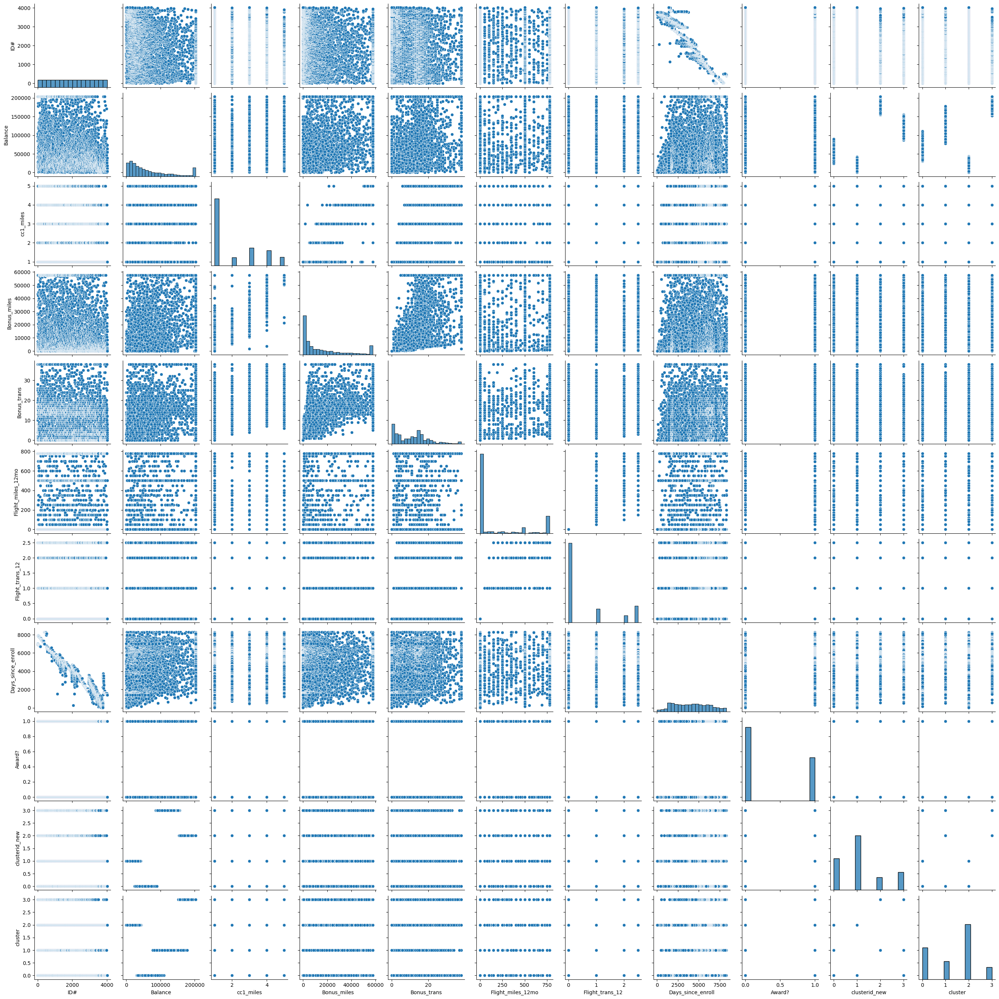

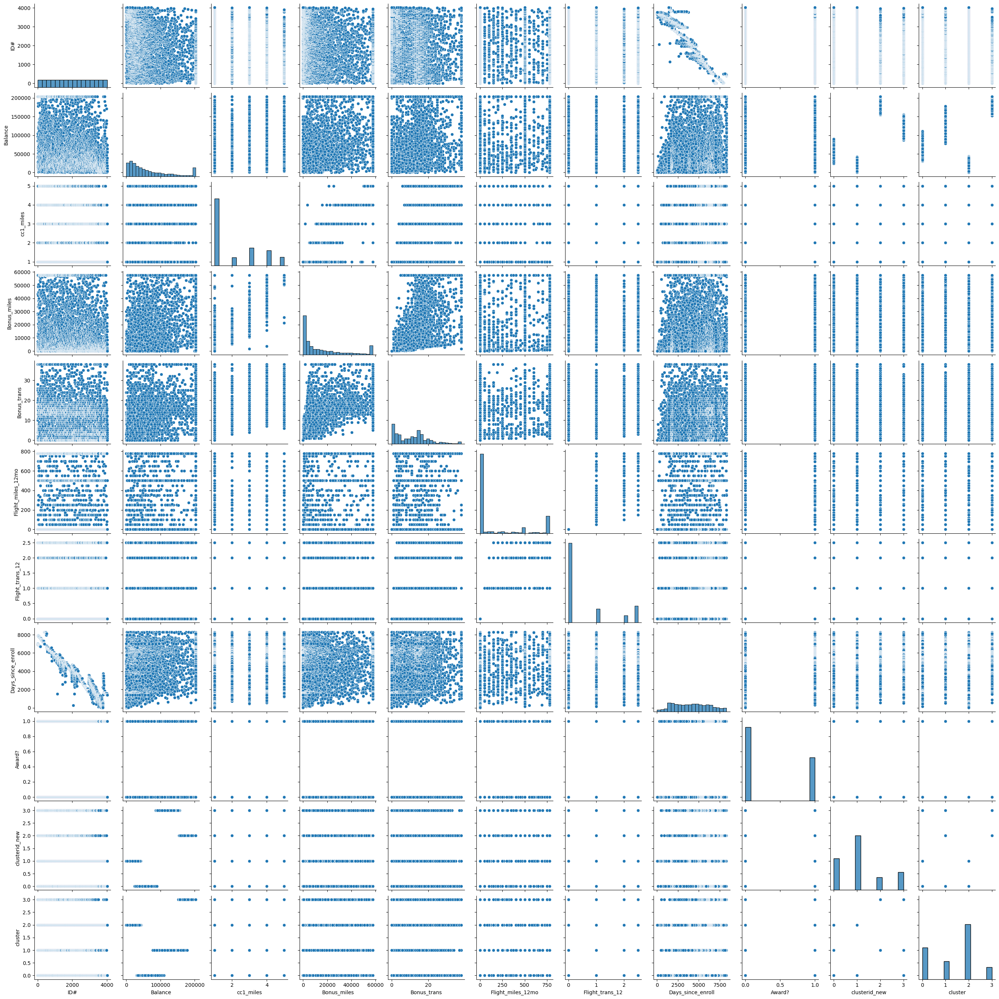

In [61]:
sns.pairplot(df)
plt.show()

# K mean Clustering

In [62]:
# # Normalization function 

scaler = StandardScaler()
scaled_Univ_df = scaler.fit_transform(df.iloc[:,1:])

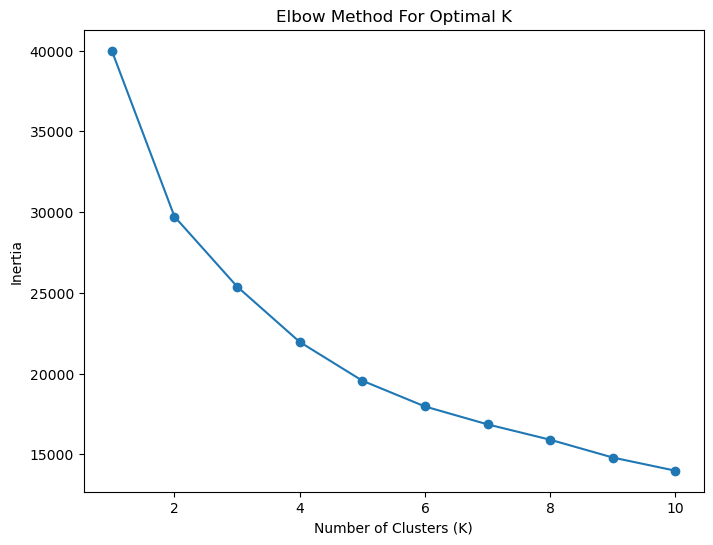

In [63]:
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(scaled_Univ_df)  # Fit the KMeans model
    wcss.append(kmeans.inertia_)
    
# Plot Elbow Curve
plt.figure(figsize=(8, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.title('Elbow Method For Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()

In [64]:
#Build Cluster algorithm

# Apply K-Means with K=4 (chosen from the Elbow method or your choice)
kmeans = KMeans(n_clusters=4, random_state=0)
y_kmeans = kmeans.fit_predict(df) 

In [65]:
kmeans.labels_

array([1, 1, 1, ..., 0, 0, 1], dtype=int32)

In [66]:
#Assign clusters to the data set

df['clusterid_new'] = kmeans.labels_

In [67]:
#these are standardized values.

kmeans.cluster_centers_

array([[1.96334223e+03, 5.95557774e+04, 2.42134315e+00, 1.94094174e+04,
        1.33716651e+01, 1.87875805e+02, 6.22815087e-01, 4.23436707e+03,
        4.06623735e-01, 1.11022302e-15, 1.38914443e-01],
       [2.28903696e+03, 1.83450032e+04, 1.34493840e+00, 5.68843827e+03,
        7.43224424e+00, 1.02164167e+02, 3.52972683e-01, 3.59894751e+03,
        2.86020354e-01, 1.00000000e+00, 1.97643278e+00],
       [1.41039401e+03, 1.93766379e+05, 3.04147465e+00, 3.14075190e+04,
        1.81774194e+01, 3.50274194e+02, 1.15092166e+00, 5.26671198e+03,
        5.52995392e-01, 2.00000000e+00, 2.89400922e+00],
       [1.69781833e+03, 1.17723265e+05, 2.90180033e+00, 2.66420585e+04,
        1.56644845e+01, 2.70153846e+02, 8.67430442e-01, 4.68473650e+03,
        4.33715221e-01, 2.99836334e+00, 8.75613748e-01]])

In [68]:
df.groupby('clusterid_new').agg(['mean']).reset_index()

,clusterid_new,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
,,mean,mean,mean,mean,mean,mean,mean,mean,mean,mean
0,0,1963.342226,59555.777369,2.421343,19409.417433,13.371665,187.875805,0.622815,4234.367065,0.406624,0.138914
1,1,2289.036958,18345.003214,1.344938,5688.438270,7.432244,102.164167,0.352973,3598.947509,0.286020,1.976433
2,2,1408.420690,193674.874713,3.045977,31467.791954,18.183908,349.468966,1.148276,5269.701149,0.554023,2.889655
3,3,1699.696721,117663.857377,2.898361,26591.264754,15.655738,270.596721,0.868852,4681.650820,0.432787,0.875410


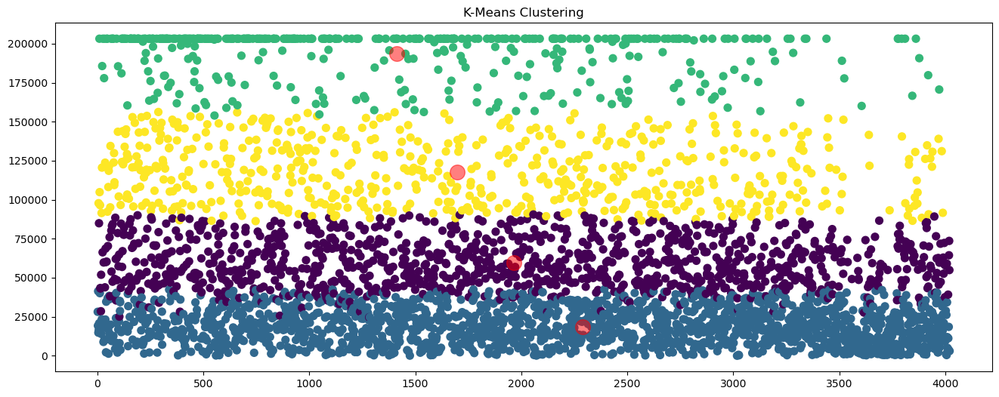

In [69]:
# Plot the results of K-Means clustering

plt.figure(figsize=(16, 6))
plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_kmeans, s=50, cmap='viridis')  
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', s=200, alpha=0.5)
plt.title('K-Means Clustering')
plt.show()

# Hierachical Clustering

In [70]:
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.datasets import make_blobs

In [71]:
# Create synthetic data for demonstration (replace with your dataset)

X, _ = make_blobs(n_samples=300, centers=4, cluster_std=0.60, random_state=0)

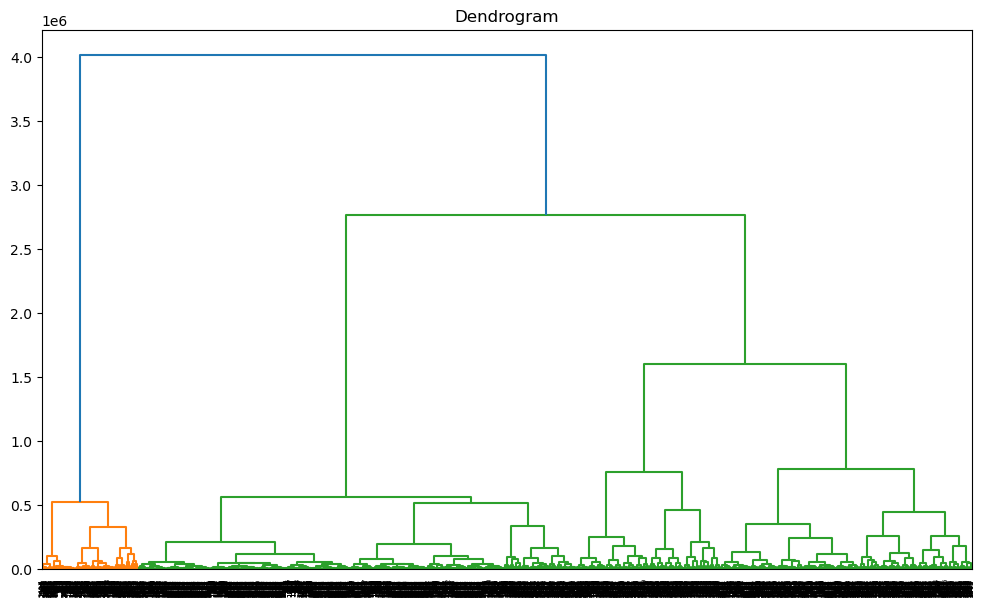

In [72]:
# Dendrogram to determine the optimal number of clusters

plt.figure(figsize=(12, 7))
plt.tight_layout
sch.dendrogram(sch.linkage(df, method='ward'))  
plt.title('Dendrogram')
plt.show()

In [73]:
# Apply Agglomerative Clustering with 4 clusters (chosen from dendrogram)

agg_clust = AgglomerativeClustering(n_clusters=4, linkage='ward')  
y_agg = agg_clust.fit_predict(df) 

In [74]:
df['cluster'] = y_agg
df.tail()

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clusterid_new,cluster
3994,4017,18476.0,1,8525.0,4.0,200.0,1.0,1403,1,1,2
3995,4018,64385.0,1,981.0,5.0,0.0,0.0,1395,1,0,0
3996,4019,73597.0,3,25447.0,8.0,0.0,0.0,1402,1,0,0
3997,4020,54899.0,1,500.0,1.0,500.0,1.0,1401,0,0,0
3998,4021,3016.0,1,0.0,0.0,0.0,0.0,1398,0,1,2


In [75]:
# Analysing the Cluster

df['cluster'] == 0

0       False
1       False
2       False
3       False
4        True
        ...  
3994    False
3995     True
3996     True
3997     True
3998    False
Name: cluster, Length: 3999, dtype: bool

In [76]:
df[df['cluster'] == 0]

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clusterid_new,cluster
4,5,97752.0,4,43300.00,26.0,777.5,2.5,6935,1,3,0
6,7,84914.0,3,27482.00,25.0,0.0,0.0,6994,0,0,0
11,12,96522.0,5,57626.25,19.0,0.0,0.0,6924,1,3,0
12,13,43382.0,2,11150.00,20.0,0.0,0.0,6924,0,0,0
13,14,43097.0,1,3258.00,6.0,0.0,0.0,6918,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
3985,4008,59017.0,4,34746.00,25.0,0.0,0.0,1418,0,0,0
3986,4009,34235.0,1,18910.00,7.0,250.0,1.0,1415,0,1,0
3995,4018,64385.0,1,981.00,5.0,0.0,0.0,1395,1,0,0
3996,4019,73597.0,3,25447.00,8.0,0.0,0.0,1402,1,0,0


In [77]:
df[df['cluster'] == 1]

,ID#,Balance,cc1_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,clusterid_new,cluster
9,10,104860.0,3,28426.00,28.0,777.5,2.5,6931,1,3,1
18,19,91473.0,3,27408.00,17.0,0.0,0.0,6903,1,3,1
20,21,120576.0,5,57626.25,23.0,250.0,2.0,6896,1,3,1
35,36,123759.0,4,50572.00,23.0,777.5,2.5,7865,1,3,1
44,45,121260.0,3,18493.00,18.0,0.0,0.0,7808,0,3,1
...,...,...,...,...,...,...,...,...,...,...,...
3915,3938,121156.0,1,12245.00,6.0,777.5,2.0,1538,1,3,1
3917,3940,130748.0,4,57626.25,37.0,777.5,2.5,1545,0,3,1
3926,3949,89222.0,1,0.00,0.0,0.0,0.0,1528,0,0,1
3946,3969,139032.0,3,19565.00,17.0,777.5,2.5,1481,0,3,1


In [78]:
df['cluster'].dtype

dtype('int64')

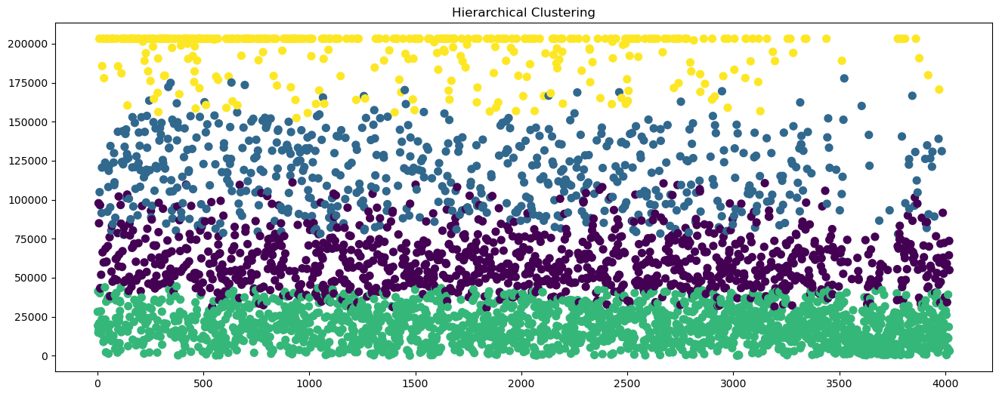

In [79]:
# Plot the results of Hierarchical Clustering

plt.figure(figsize=(16, 6))
plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_agg, s=50, cmap='viridis')  
plt.title('Hierarchical Clustering')
plt.show()

# DBSCAN

In [80]:
# Apply DBSCAN with chosen parameters

dbscan = DBSCAN(eps=0.5, min_samples=5)
y_dbscan = dbscan.fit_predict(data)

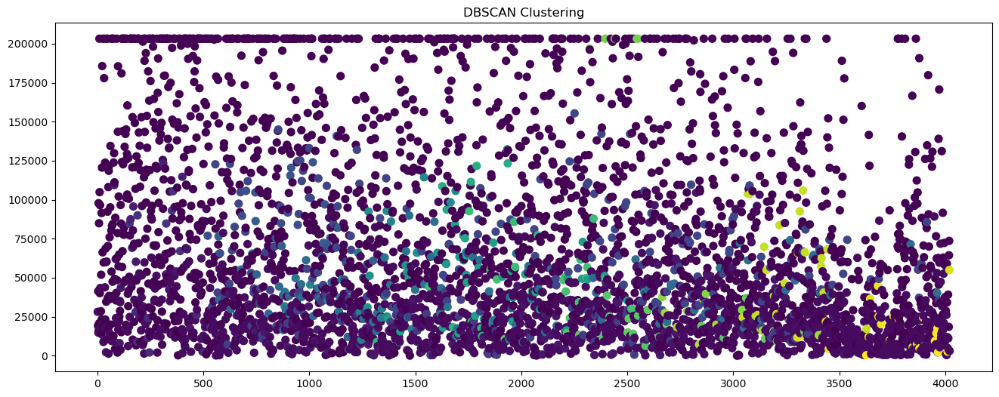

In [81]:
# Plot the results of DBSCAN clustering

plt.figure(figsize=(16, 6))
plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_dbscan, s=50, cmap='viridis')  # Use .iloc for DataFrame indexing
plt.title('DBSCAN Clustering')
plt.show()

# Clustering Analysis and Interpreation

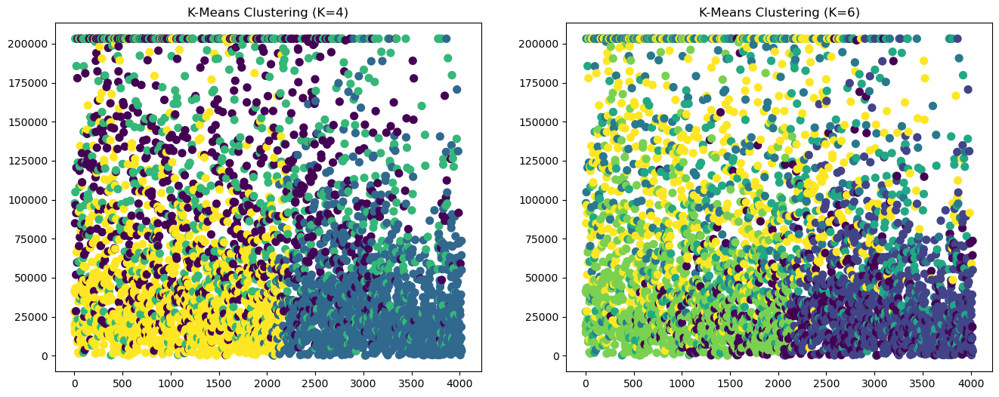

In [82]:
# Apply K-Means with different K values
kmeans_4 = KMeans(n_clusters=4, random_state=0)
y_kmeans_4 = kmeans_4.fit_predict(data)

kmeans_6 = KMeans(n_clusters=6, random_state=0)
y_kmeans_6 = kmeans_6.fit_predict(data)

# Plot the results of K-Means clustering for K=4 and K=6
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# For K=4
ax[0].scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_kmeans_4, s=50, cmap='viridis')
ax[0].set_title('K-Means Clustering (K=4)')

# For K=6
ax[1].scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_kmeans_6, s=50, cmap='viridis')
ax[1].set_title('K-Means Clustering (K=6)')

plt.show()

In [83]:
# Evaluate K-Means performance using Silhouette Score

kmeans_score_4 = silhouette_score(data, y_kmeans_4)
kmeans_score_6 = silhouette_score(data, y_kmeans_6)

print(f"Silhouette Score for K-Means (K=4): {kmeans_score_4}")
print(f"Silhouette Score for K-Means (K=6): {kmeans_score_6}")

Silhouette Score for K-Means (K=4): 0.23904467973691296
Silhouette Score for K-Means (K=6): 0.25632576484779934


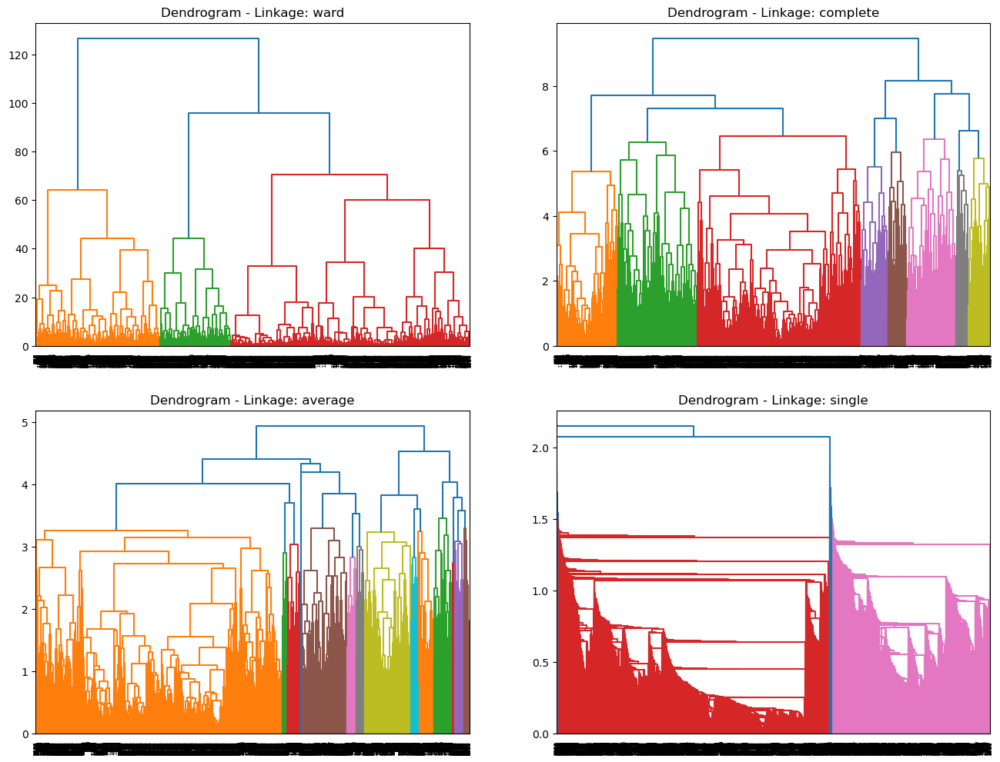

In [84]:
# 2. Hierarchical Clustering - Experimenting with different Linkage Methods

linkages = ['ward', 'complete', 'average', 'single']
fig, ax = plt.subplots(2, 2, figsize=(16, 12))

# Generate Dendrograms for different linkage methods
for i, linkage in enumerate(linkages):
    ax[i//2, i%2].set_title(f'Dendrogram - Linkage: {linkage}')
    sch.dendrogram(sch.linkage(data, method=linkage), ax=ax[i//2, i%2])

plt.show()

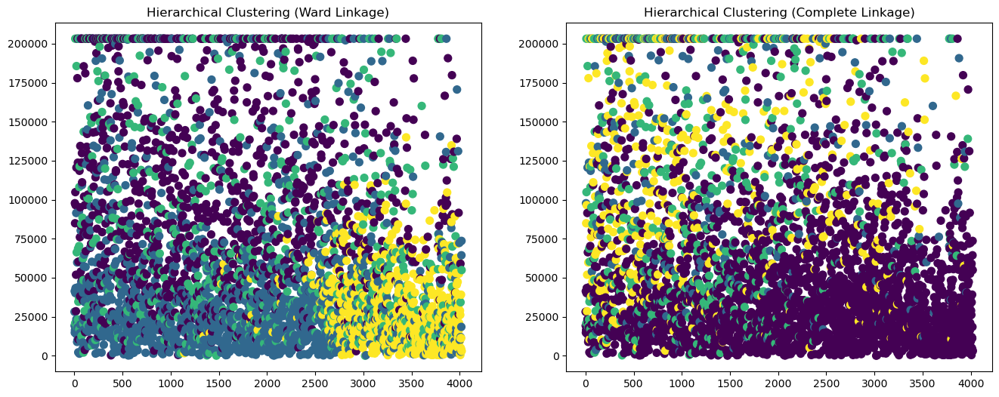

In [85]:
# Apply Agglomerative Clustering with different linkage methods (K=4)

agg_clust_ward = AgglomerativeClustering(n_clusters=4, linkage='ward')
y_agg_ward = agg_clust_ward.fit_predict(data)

agg_clust_complete = AgglomerativeClustering(n_clusters=4, linkage='complete')
y_agg_complete = agg_clust_complete.fit_predict(data)

# Plot the results of Hierarchical Clustering with different linkage methods
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# For Ward linkage
ax[0].scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_agg_ward, s=50, cmap='viridis')
ax[0].set_title('Hierarchical Clustering (Ward Linkage)')

# For Complete linkage
ax[1].scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_agg_complete, s=50, cmap='viridis')
ax[1].set_title('Hierarchical Clustering (Complete Linkage)')

plt.show()

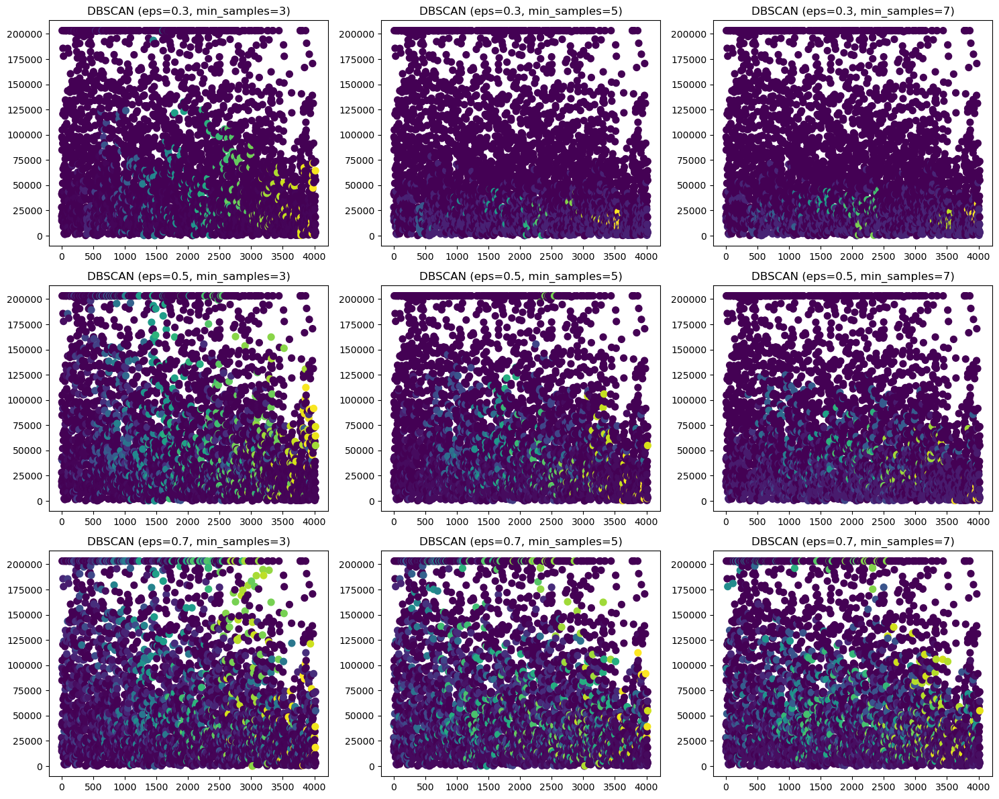

Silhouette Score for DBSCAN: -0.14805375458374886


In [86]:
# 3. DBSCAN Clustering - Experimenting with different eps and min_samples values

eps_values = [0.3, 0.5, 0.7]  # Different epsilon values
min_samples_values = [3, 5, 7]  # Different min_samples values

fig, ax = plt.subplots(len(eps_values), len(min_samples_values), figsize=(15, 12))

# Experiment with different eps and min_samples values
for i, eps in enumerate(eps_values):
    for j, min_samples in enumerate(min_samples_values):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        y_dbscan = dbscan.fit_predict(data)
        
        ax[i, j].scatter(df.iloc[:, 0], df.iloc[:, 1], c=y_dbscan, s=50, cmap='viridis')
        ax[i, j].set_title(f'DBSCAN (eps={eps}, min_samples={min_samples})')

plt.tight_layout()
plt.show()

# Evaluate DBSCAN performance using Silhouette Score
dbscan_score = silhouette_score(data, y_dbscan)  # Use the last DBSCAN result
print(f"Silhouette Score for DBSCAN: {dbscan_score}")